<a href="https://colab.research.google.com/github/kk573113/2025-1-CV/blob/main/Assignment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# HW#2-1

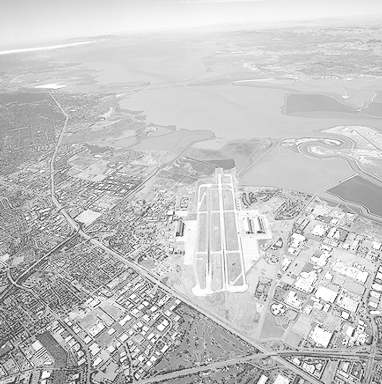

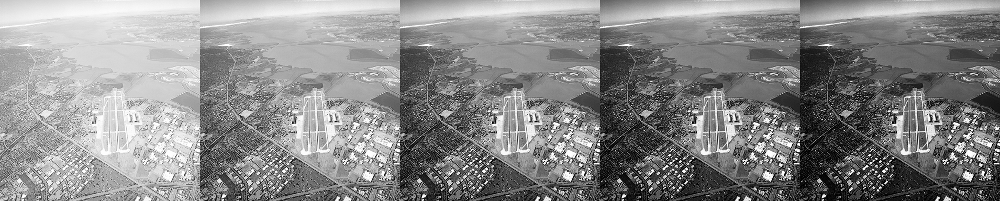

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow    # colab에서 cv.imshow 사용

img=cv.imread('Fig0309(a)(washed_out_aerial_image).tif')

img=cv.resize(img,dsize=(0,0),fx=0.5,fy=0.5)
cv2_imshow(img)

def gamma(f,gamma=1.0):
    f1=f/255.0			# L=256이라고 가정, 픽셀을 0~1로 정규
    return np.uint8(255*(f1**gamma))   # 감마 보정 후 다시 0~255로 변환

gc=np.hstack((gamma(img,1.0),gamma(img,2.0), gamma(img,3.0), gamma(img,4.0), gamma(img,5.0)))
## np.hstack : NumPy 배열을 '수평(Horizontal)'으로 쌓아주는 함수
cv2_imshow(gc)

# 감마가 커질수록 이미지가 어두워지는 효과를 보임.

# HW#2-2

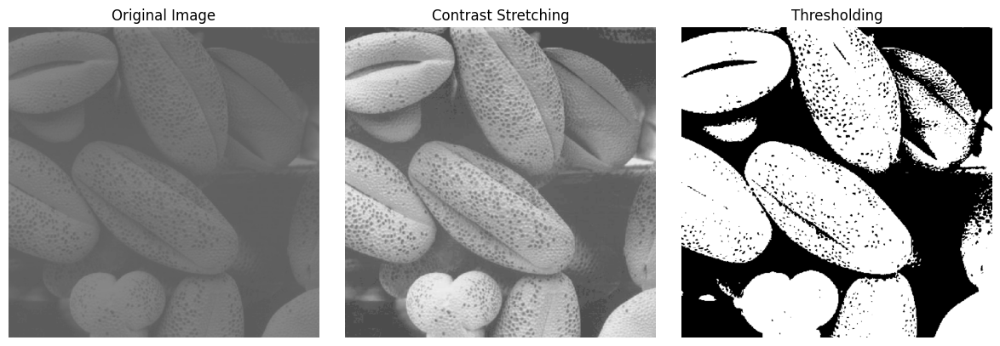

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('Fig0310(b)(washed_out_pollen_image).tif')

# Piecewise-Linear
def piecewise_linear_transform(img, r1, r2, s1, s2):
    output = np.zeros_like(img, dtype=np.float32)
    mask1 = img <= r1
    mask2 = (img > r1) & (img <= r2)
    mask3 = img > r2

    output[mask1] = s1 / r1 * img[mask1]
    output[mask2] = ((s2 - s1) / (r2 - r1)) * (img[mask2] - r1) + s1
    output[mask3] = ((255 - s2) / (255 - r2)) * (img[mask3] - r2) + s2

    return np.clip(output, 0, 255).astype(np.uint8)

r1, r2, s1, s2 = 70, 140, 0, 255
stretch = piecewise_linear_transform(img, r1, r2, s1, s2)
_, thresh = cv.threshold(stretch, 128, 255, cv.THRESH_BINARY)

titles = ['Original Image', 'Contrast Stretching', 'Thresholding']
images = [img, stretch, thresh]

plt.figure(figsize=(12, 4))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

# 오리지널 이미지는 전체적으로 어두운 회색빛이며 잘 구분이 안됨
# contrast stretching을 한 이미지는 명암대비가 더 커져서 어두운 부분과 밝은 부분이 명확하게 구분됨
# thresholding을 한 이미지는 흰색과 검은색으로 구분이 되며 배경과 분리가 되는 효과가 있음

# HW#2-3

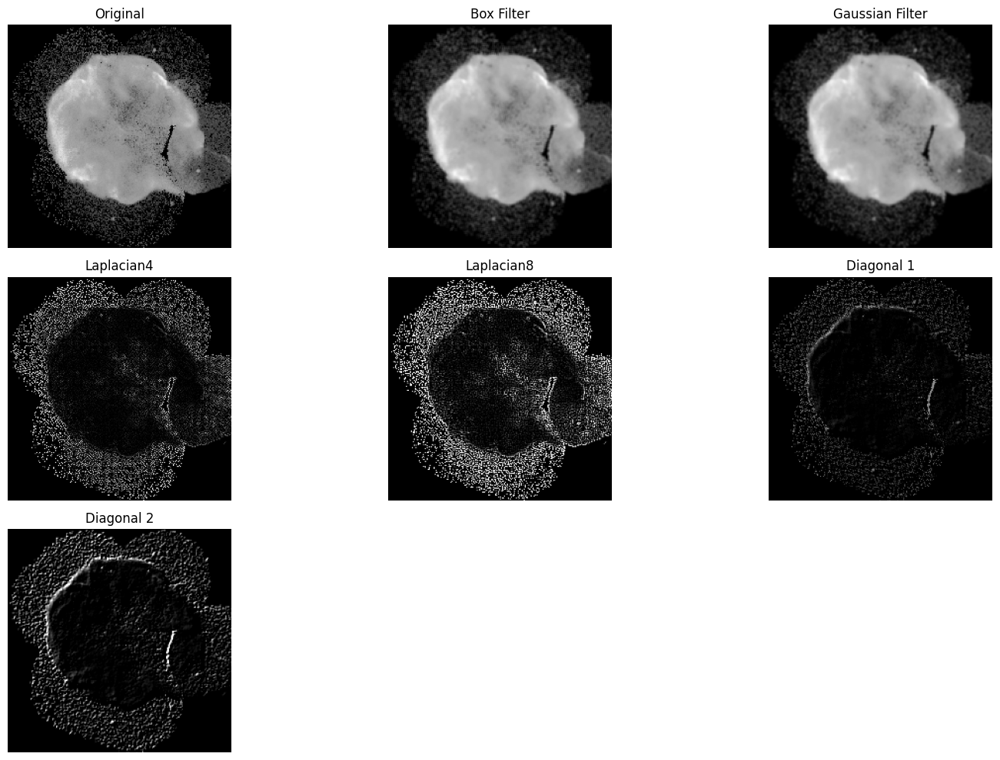

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread('Fig0938(a)(cygnusloop_Xray_original).tif', cv2.IMREAD_GRAYSCALE)
img = cv2.resize(img, dsize=(0, 0), fx=0.4, fy=0.4)

# 평균 필터
box_kernel = np.ones((3, 3), dtype=np.float32) / 9.0

# 가우시안 필터
gaussian_kernel = np.array([
    [0.0030, 0.0133, 0.0219, 0.0133, 0.0030],
    [0.0133, 0.0596, 0.0983, 0.0596, 0.0133],
    [0.0219, 0.0983, 0.1621, 0.0983, 0.0219],
    [0.0133, 0.0596, 0.0983, 0.0596, 0.0133],
    [0.0030, 0.0133, 0.0219, 0.0133, 0.0030]
], dtype=np.float32)

# 라플라시안 필터
laplace_4 = np.array([[0, -1, 0],
                      [-1, 4, -1],
                      [0, -1, 0]], dtype=np.float32)

laplace_8 = np.array([[-1, -1, -1],
                      [-1,  8, -1],
                      [-1, -1, -1]], dtype=np.float32)

# 대각선 edge 필터
diagonal_ne = np.array([[-1, 0, 0],
                        [0, 0, 0],
                        [0, 0, 1]], dtype=np.float32)

diagonal_nw = np.array([[-1, -1, 0],
                        [-1, 0, 1],
                        [0, 1, 1]], dtype=np.float32)

results = {
    'Original': img,
    'Box Filter': cv2.filter2D(img, -1, box_kernel),
    'Gaussian Filter': cv2.filter2D(img, -1, gaussian_kernel),
    'Laplacian4': cv2.filter2D(img, -1, laplace_4),
    'Laplacian8': cv2.filter2D(img, -1, laplace_8),
    'Diagonal 1': cv2.filter2D(img, -1, diagonal_ne),
    'Diagonal 2': cv2.filter2D(img, -1, diagonal_nw),
}

plt.figure(figsize=(15, 10))
for i, (title, image) in enumerate(results.items()):
    plt.subplot(3, 3, i + 1)
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

# 박스 필터는 가우시안 필터와 비슷하게 블러 처리가 되었지만 가우시안필터가 조금 더 흐릿하게 보임
# 라플라시안4는 조직의 주변을 강조하여 노이즈가 함께 부각됨
# 라플라시안8은 라플라시안4보다 더 강하게 강조하여 노이즈가 더 선명하게 부각됨
# diagonal1은 음영진 것처럼 어두워진 반면 diagnal2는 1에 비해 조금은 밝으며 조직의 경계가 더 부각됨

# HW#2-4

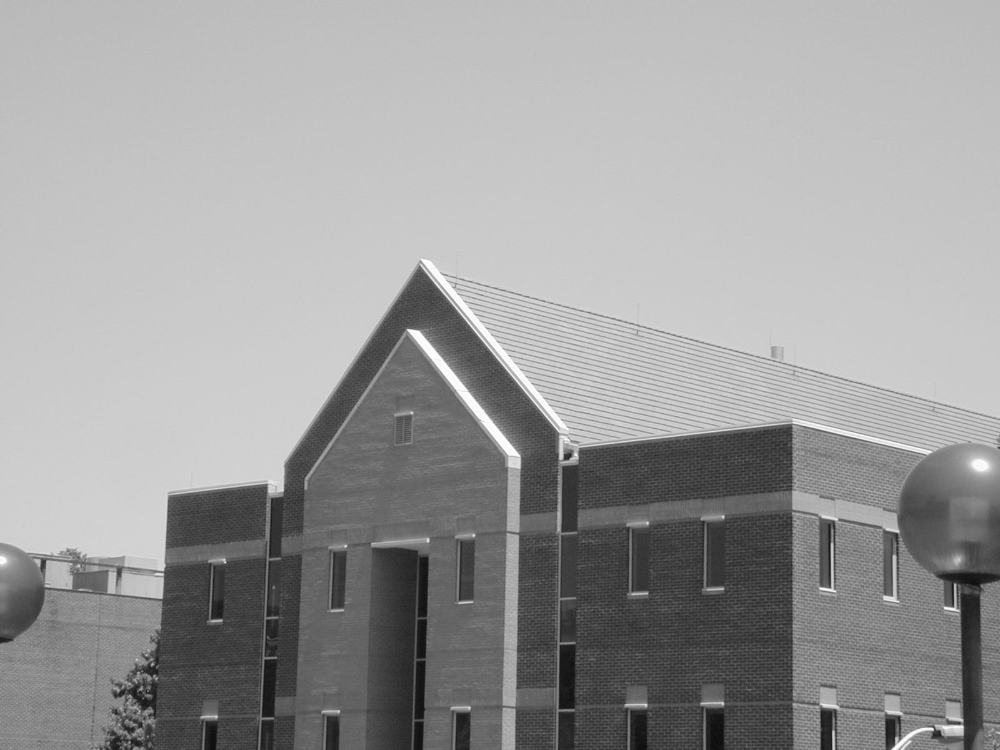

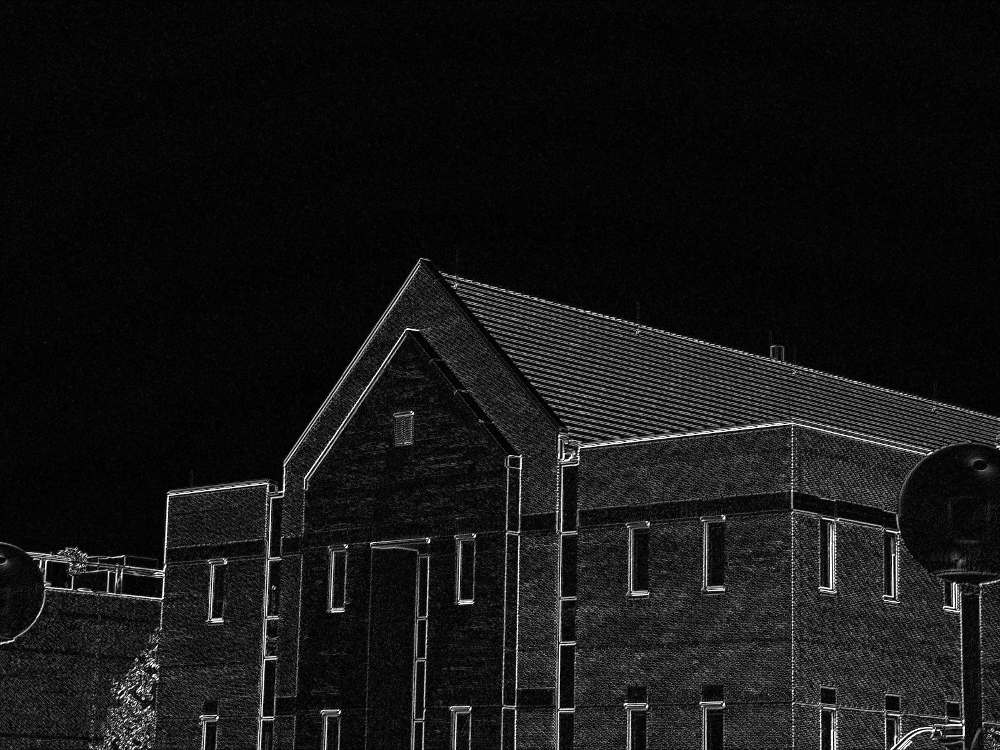

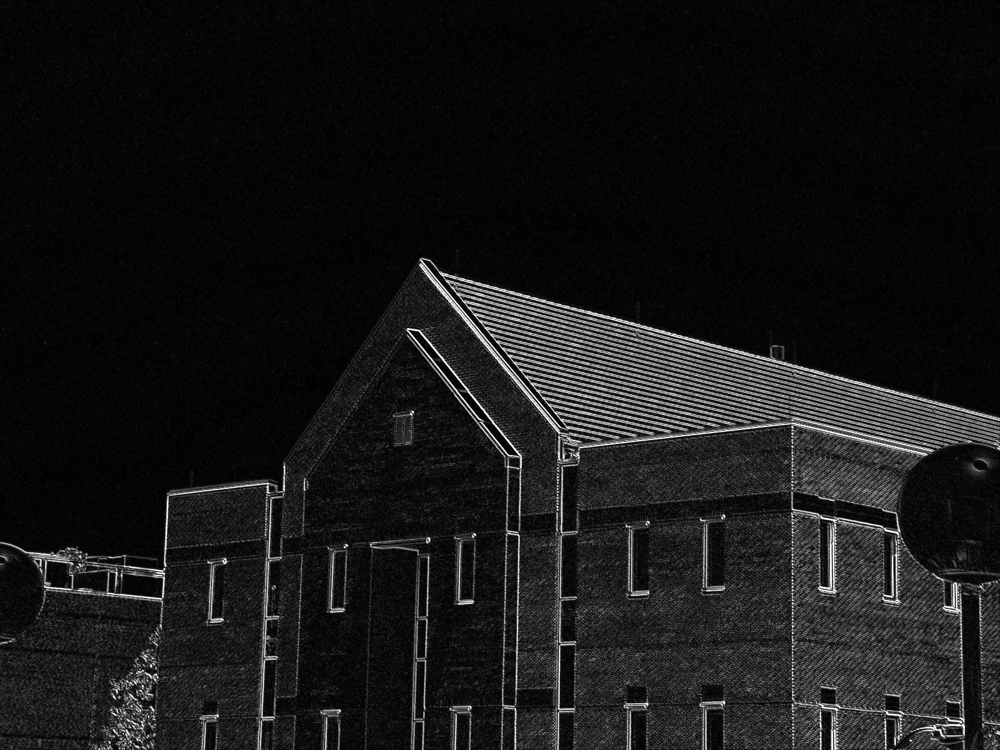

In [4]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow  # 코랩 환경일 경우

img = cv2.imread('school.jpg', cv2.IMREAD_GRAYSCALE)

# 45도, -45도 방향 Sobel 마스크
diag_45 = np.array([
    [-1, -2,  0],
    [-2,  0,  2],
    [ 0,  2,  1]
], dtype=np.float32)

diag_m45 = np.array([
    [ 0,  2,  1],
    [-2,  0,  2],
    [-1, -2,  0]
], dtype=np.float32)

grad_45 = cv2.filter2D(img, cv2.CV_32F, diag_45)
grad_m45 = cv2.filter2D(img, cv2.CV_32F, diag_m45)

abs_grad_45 = cv2.convertScaleAbs(grad_45)
abs_grad_m45 = cv2.convertScaleAbs(grad_m45)

cv2_imshow(img)
cv2_imshow(abs_grad_45)
cv2_imshow(abs_grad_m45)
cv2.waitKey(0)
cv2.destroyAllWindows()

# HW#2-5

수업시간에 배운 방법 기본적으로 적용

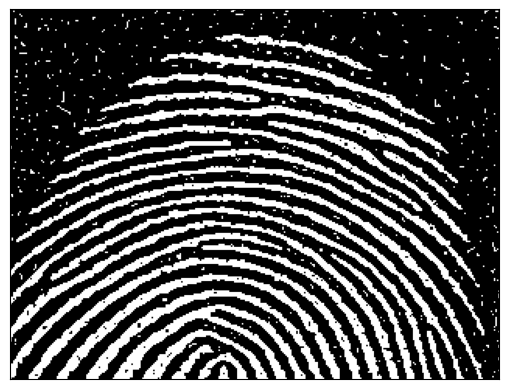

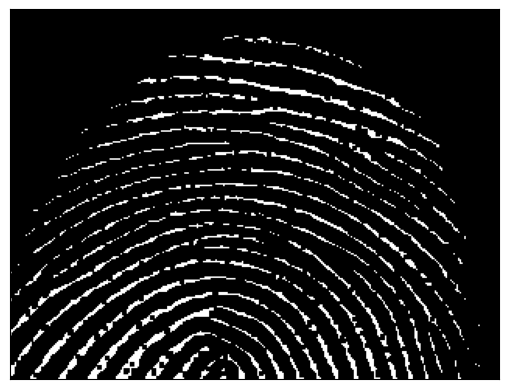

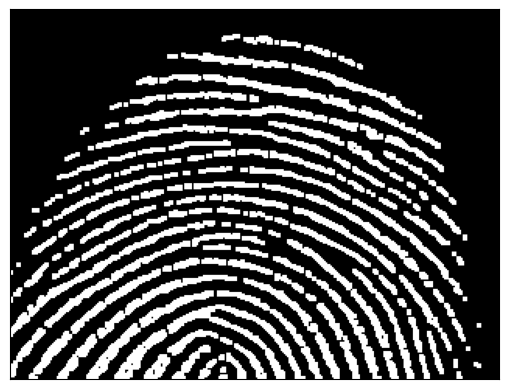

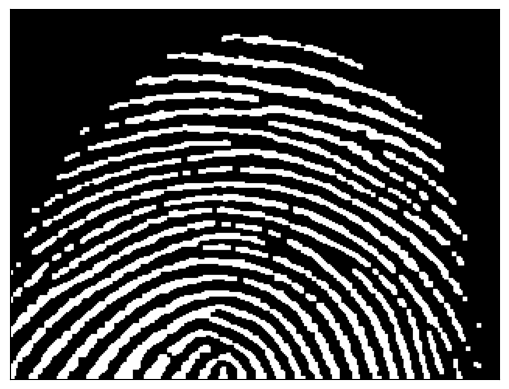

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img=cv.imread('finger.jpg', cv.IMREAD_UNCHANGED)

t,bin_img=cv.threshold(img,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
plt.imshow(bin_img, cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

se=np.uint8([[1,1,1],
             [1,1,1],
             [1,1,1],
            ])

# 침식
img_erosion=cv.erode(bin_img,se,iterations=1)
plt.imshow(img_erosion,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

# # 열기
# img_opening=cv.dilate(cv.erode(img_erosion,se,iterations=1),se,iterations=1)
# plt.imshow(img_opening,cmap='gray'), plt.xticks([]), plt.yticks([])
# plt.show()

# 팽창
img_dilation=cv.dilate(img_erosion,se,iterations=1)
plt.imshow(img_dilation,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

# 닫기
img_closing=cv.erode(cv.dilate(img_dilation,se,iterations=1),se,iterations=1)
plt.imshow(img_closing,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

# 침식-팽창-닫기 과정을 거치면 개선된 이미지가 나옴
# 침식을 통해 노이즈를 제거하고 팽창을 통해 원본 이미지로 복구함

다른 방법 적용

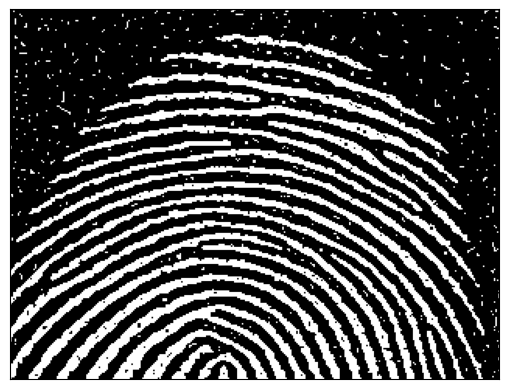

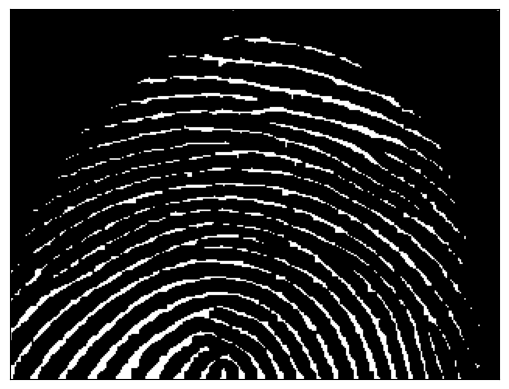

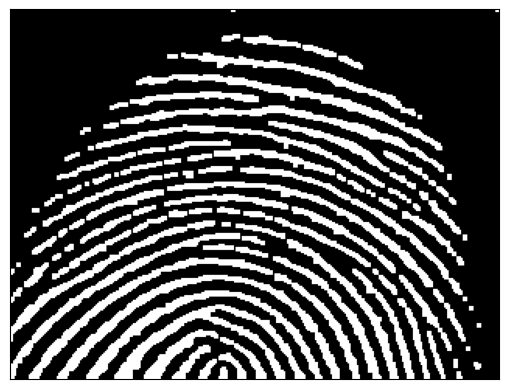

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img=cv.imread('finger.jpg', cv.IMREAD_UNCHANGED)

t,bin_img=cv.threshold(img,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
plt.imshow(bin_img, cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

se=np.uint8([[1,1,1],
             [1,1,1],
             [1,1,1],
            ])

# # 열기
# img_opening=cv.dilate(cv.erode(bin_img,se,iterations=1),se,iterations=2)
# plt.imshow(img_opening,cmap='gray'), plt.xticks([]), plt.yticks([])
# plt.show()

# # 침식
# img_erosion=cv.erode(bin_img,se,iterations=1)
# plt.imshow(img_erosion,cmap='gray'), plt.xticks([]), plt.yticks([])

# # 닫기
img_closing=cv.erode(cv.dilate(bin_img,se,iterations=1),se,iterations=2)
plt.imshow(img_closing,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

# 팽창
img_dilation=cv.dilate(img_closing,se,iterations=1)
plt.imshow(img_dilation,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

# 닫기와 팽창만 적용했을 때 약간의 노이즈가 잘 제거되진 않았지만 상당히 개선이 되는 것을 알 수 있음



# HW#2-6

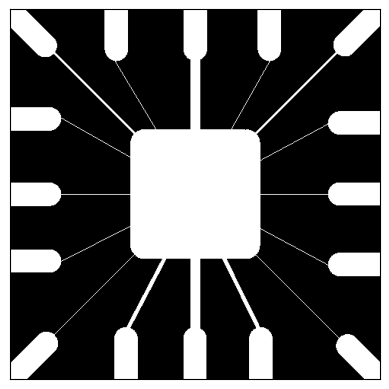

(<matplotlib.image.AxesImage at 0x793dc4f4c710>, ([], []), ([], []))

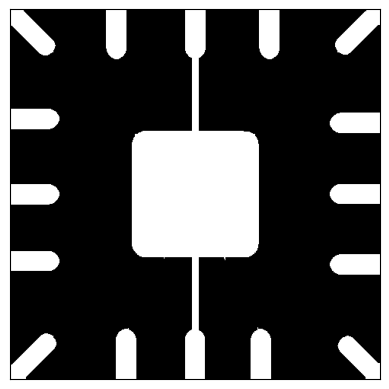

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img=cv.imread('Fig0905(a)(wirebond-mask).tif', cv.IMREAD_UNCHANGED)

t,bin_img=cv.threshold(img,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
plt.imshow(bin_img, cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

# 위 아래를 연결하는 선분을 제외하고 없애기 위해 침식 마스크의 모양을 테두리 모양으로 만듦
se=np.uint8([[1,1,1,1,1],
             [1,0,0,0,1],
             [1,0,0,0,1],
             [1,0,0,0,1],
             [1,1,1,1,1]
            ])

# 침식
img_erosion=cv.erode(bin_img,se,iterations=1)
plt.imshow(img_erosion,cmap='gray'), plt.xticks([]), plt.yticks([])

# # 열기
# img_opening=cv.erode(cv.dilate(img_erosion,se,iterations=1),se,iterations=1)
# plt.imshow(img_opening,cmap='gray'), plt.xticks([]), plt.yticks([])
# plt.show()

# # 팽창
# img_dilation=cv.dilate(img_opening,se,iterations=1)
# plt.imshow(img_dilation,cmap='gray'), plt.xticks([]), plt.yticks([])
# plt.show()


# # 닫기
# img_closing=cv.erode(cv.dilate(img_dilation,se,iterations=1),se,iterations=1)
# plt.imshow(img_closing,cmap='gray'), plt.xticks([]), plt.yticks([])
# plt.show()

# HW#2-7

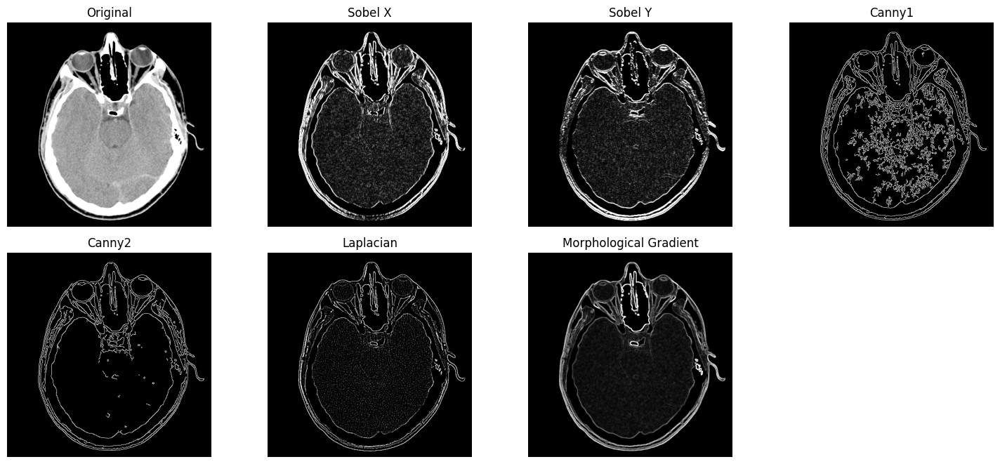

In [8]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('Fig0939(a)(headCT-Vandy).tif')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Laplacian
laplacian = cv.Laplacian(gray, cv.CV_8U, ksize=3)

# Sobel
grad_x = cv.Sobel(gray, cv.CV_32F, 1, 0, ksize=3)
grad_y = cv.Sobel(gray, cv.CV_32F, 0, 1, ksize=3)
sobel_x = cv.convertScaleAbs(grad_x)
sobel_y = cv.convertScaleAbs(grad_y)

# Canny
canny1 = cv.Canny(gray, 50, 150)
canny2 = cv.Canny(gray, 100, 200)

se = np.uint8([[1,1,1],
               [1,1,1],
               [1,1,1]])

# Morphological Gradient
img_dilation = cv.dilate(gray, se, iterations=1)
img_erosion = cv.erode(gray, se, iterations=1)
morph_gradient = cv.subtract(img_dilation, img_erosion)


images = [gray, sobel_x, sobel_y,canny1, canny2, laplacian, morph_gradient]

titles = ['Original', 'Sobel X', 'Sobel Y', 'Canny1', 'Canny2', 'Laplacian', 'Morphological Gradient']

# Morphological Gradient>Canny2>Laplacian>Sobel 순으로 개선이 잘됨
# Morphological Gradient edge detect가 가장 깔끔하게 됨
# Canny2가 Laplacian보다 조금 더 선명함
# Sobel이 노이즈가 가장 제거가 덜 됨

plt.figure(figsize=(15, 10))
for i in range(len(images)):
    plt.subplot(3, 4, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

# HW#2-8

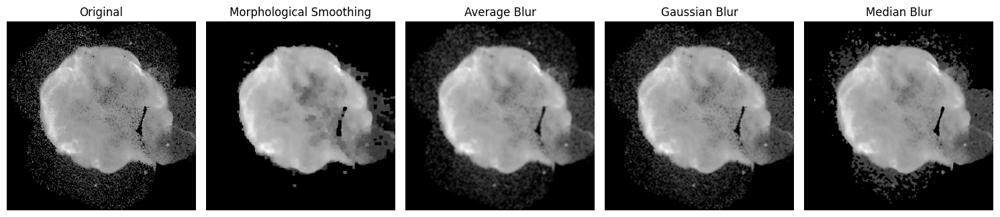

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('Fig0938(a)(cygnusloop_Xray_original).tif')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

se=np.uint8([[1,1,1,1,1,1,1],
             [1,1,1,1,1,1,1],
             [1,1,1,1,1,1,1],
             [1,1,1,1,1,1,1],
             [1,1,1,1,1,1,1],
             [1,1,1,1,1,1,1],
             [1,1,1,1,1,1,1],
            ])
# Morphological Smoothing
# 열기 후 닫기 수행
img_opening=cv.dilate(cv.erode(gray,se,iterations=1),se,iterations=1)
morph_smoothing = cv.erode(cv.dilate(img_opening, se, iterations=1), se, iterations=1)


# Smoothing Filter
avg_blur = cv.blur(gray, (7, 7))
gaussian_blur = cv.GaussianBlur(gray, (7, 7), 0)
median_blur = cv.medianBlur(gray, 7)

titles = ['Original', 'Morphological Smoothing',
          'Average Blur', 'Gaussian Blur', 'Median Blur']

images = [gray, morph_smoothing, avg_blur, gaussian_blur, median_blur]

plt.figure(figsize=(15, 10))
for i in range(len(images)):
    plt.subplot(1, 5, i + 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

# 구름 같은 모양 주변의 자글자글한 점들을 노이즈로 생각하고 7*7 커널로 만듦
# Morphological>Median Blur>Average=Gaussian Blur 순으로 잘 지워짐
# Morphological Smoothing이 가장 깔끔하게 노이즈를 지움

# HW#2-9

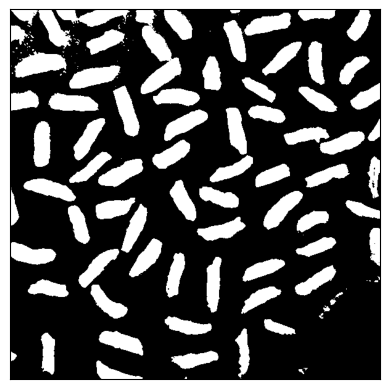

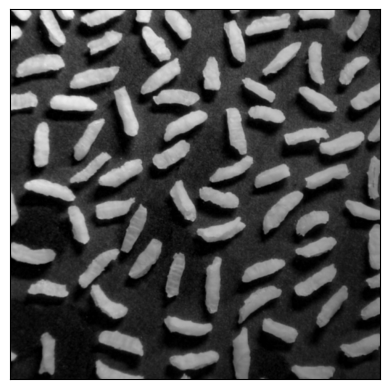

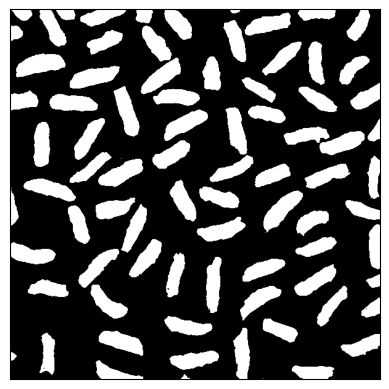

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('Fig0940(a)(rice_image_with_intensity_gradient).tif')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Otsu
t,bin_otsu=cv.threshold(img[:,:,2],0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
plt.imshow(bin_otsu, cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

se = cv.getStructuringElement(cv.MORPH_ELLIPSE, (81, 81))


# 원본-opening
img_opening=cv.dilate(cv.erode(gray,se,iterations=1),se,iterations=1)
top_hat = cv.subtract(gray, img_opening)
plt.imshow(top_hat, cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

# Top-hat->Otsu
t,bin_top_hat_otsu=cv.threshold(top_hat, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
plt.imshow(bin_top_hat_otsu, cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

# Otsu만 이용해서 이진화를 했을 경우 흑백 처리된 부분도 있고 제대로 이진화가 되지 않음
# Top-hat 변환 후 Otsu를 적용하면 깔끔하게 이진화가 잘됨

# HW#2-10

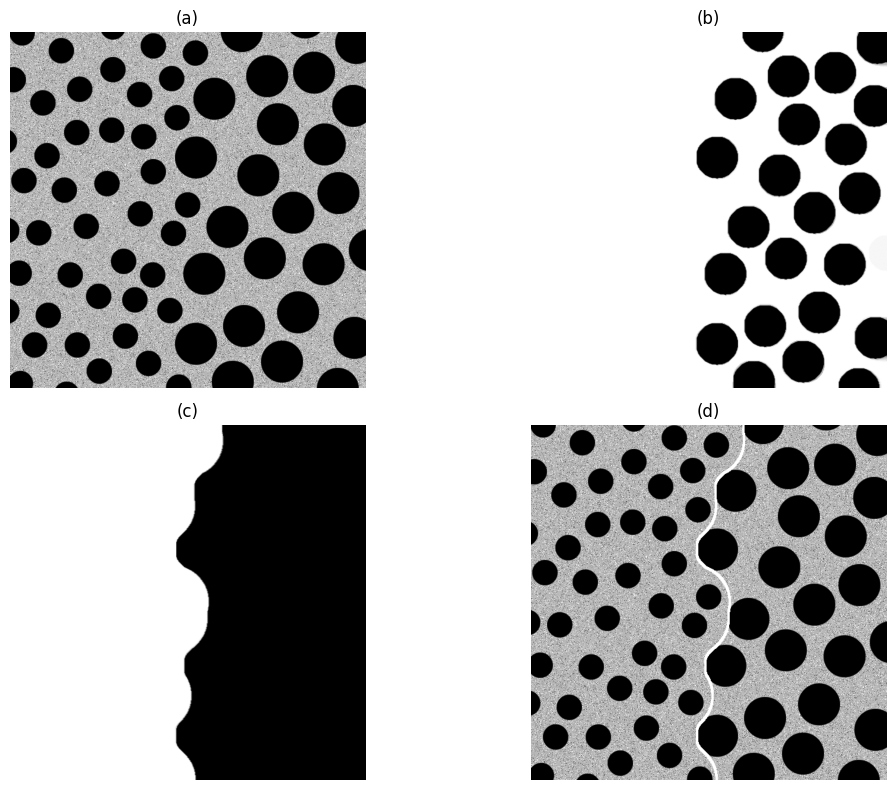

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('Fig0943(a)(dark_blobs_on_light_background).tif', cv.IMREAD_GRAYSCALE)

# (a) Original Image
img_a = img

# (b) 닫힘 연산 → 작은 얼룩 제거
# 작은 얼룩 크기: 25, 구조 요소 크기: 30
se_b = cv.getStructuringElement(cv.MORPH_ELLIPSE, (60, 60))
img_closing = cv.erode(cv.dilate(img, se_b, iterations=1), se_b, iterations=1)

# (c) 열기 연산 → 밝은 패치 제거
# 구조 요소 크기: 60
se_c = cv.getStructuringElement(cv.MORPH_ELLIPSE, (120, 120))
img_opening = cv.dilate(cv.erode(img_closing, se_c, iterations=1), se_c, iterations=1)

# (d) 형태학적 기울기 → 경계 추출
se = np.uint8([[1,1,1],
               [1,1,1],
               [1,1,1]])

img_dilation = cv.dilate(img_opening, se, iterations=2)
img_erosion = cv.erode(img_opening, se, iterations=2)
morph_gradient = cv.subtract(img_dilation, img_erosion)

t, mask = cv.threshold(morph_gradient, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
img_morph_gradient = img_a.copy()
img_morph_gradient[mask == 255] = 255

titles = ['(a)', '(b)',
          '(c)', '(d)']
images = [img_a, img_closing, img_opening, img_morph_gradient]

plt.figure(figsize=(12, 8))
for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()
